<a href="https://colab.research.google.com/github/S48avio/VGG-Networks-and-Style-Transfer/blob/main/Neural_Style_Transfer_Using_VGG19.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
from PIL import Image
import torchvision.transforms as transforms
import torchvision.models as models
import matplotlib.pyplot as plt

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def load_image(image_path, max_size=400, shape=None):
    image = Image.open(image_path).convert('RGB')

    # Resize image if it's too large to save GPU memory
    size = max_size if max(image.size) > max_size else max(image.size)

    if shape:
        size = shape

    in_transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
    ])

    # Add batch dimension (.unsqueeze(0))
    image = in_transform(image).unsqueeze(0)
    return image.to(device)

def im_convert(tensor):
    """ Helper to convert a tensor back to a displayable image """
    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1, 2, 0)
    image = image * (0.229, 0.224, 0.225) + (0.485, 0.456, 0.406) # Denormalize
    image = image.clip(0, 1)
    return image

In [2]:
class VGG(nn.Module):
    def __init__(self):
        super().__init__()
        # Get the feature part of VGG19
        self.chosen_features = ['0', '5', '10', '19', '28'] # Style Layers
        self.content_layer = '21' # Content Layer (Conv4_2)
        self.model = models.vgg19(pretrained=True).features[:29] # Freeze up to layer 28

        for param in self.model.parameters():
            param.requires_grad = False

    def forward(self, x):
        features = {}
        for name, layer in self.model._modules.items():
            x = layer(x)
            if name in self.chosen_features:
                features[name] = x
            if name == self.content_layer:
                features['content'] = x
        return features

# Initialize model
vgg = VGG().to(device).eval()

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:07<00:00, 77.7MB/s]


In [3]:
def gram_matrix(tensor):
    """ Calculate the Gram Matrix of a given tensor """
    batch_size, d, h, w = tensor.size()
    tensor = tensor.view(d, h * w)
    gram = torch.mm(tensor, tensor.t())
    return gram / (d * h * w) # Normalize by size

def get_style_loss(target_features, style_grams, style_weights):
    style_loss = 0
    # Compare the Gram Matrix of our 'target' to the 'style' image
    for layer in style_weights:
        target_feature = target_features[layer]
        target_gram = gram_matrix(target_feature)
        style_gram = style_grams[layer]
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        style_loss += layer_style_loss
    return style_loss

Step 500, Total Loss: 9.371293067932129


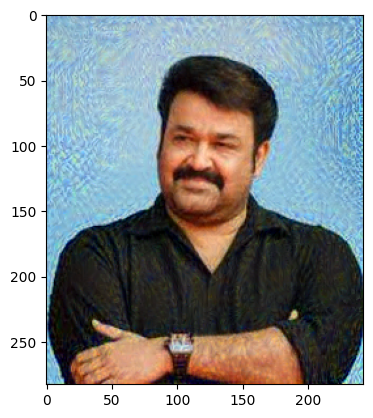

Step 1000, Total Loss: 6.993465423583984


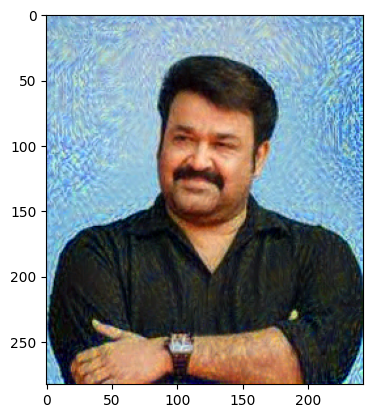

Step 1500, Total Loss: 6.175031661987305


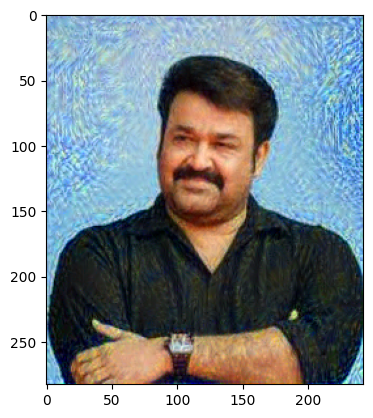

Step 2000, Total Loss: 5.724458694458008


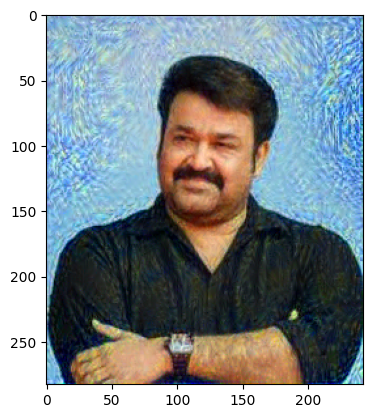

Step 2500, Total Loss: 5.416075706481934


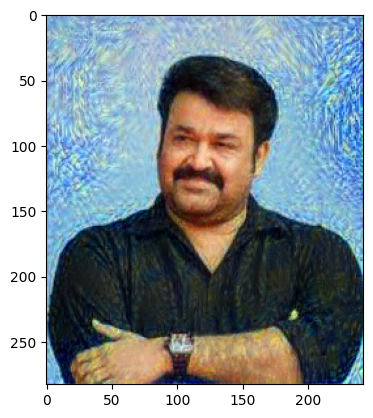

Step 3000, Total Loss: 5.181645393371582


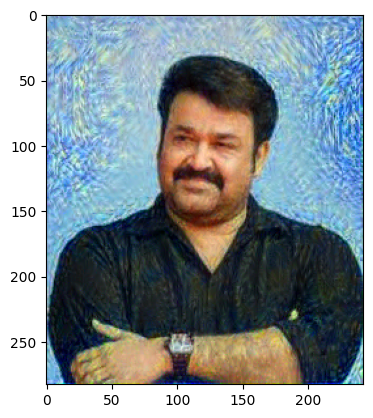

Step 3500, Total Loss: 4.995220184326172


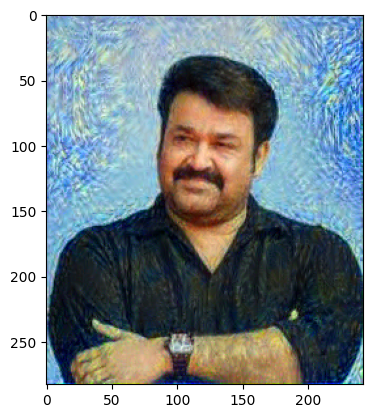

Step 4000, Total Loss: 4.849808692932129


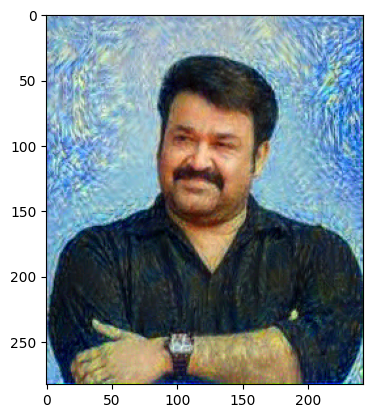

Step 4500, Total Loss: 4.729996681213379


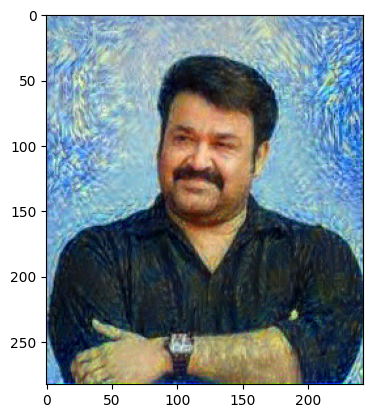

Step 5000, Total Loss: 4.630640029907227


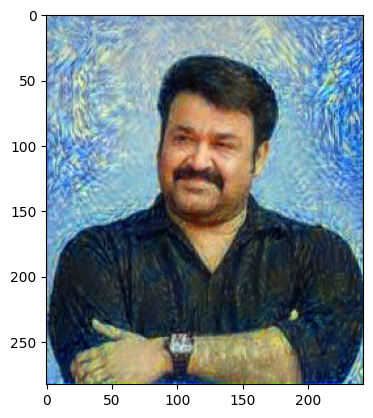

Step 5500, Total Loss: 4.550142765045166


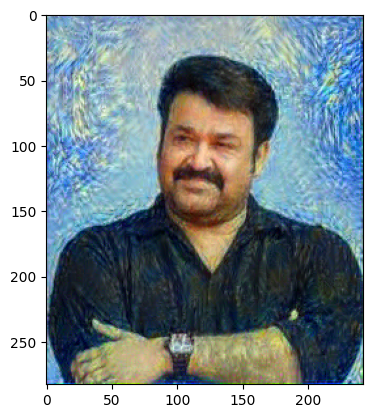

Step 6000, Total Loss: 4.482172012329102


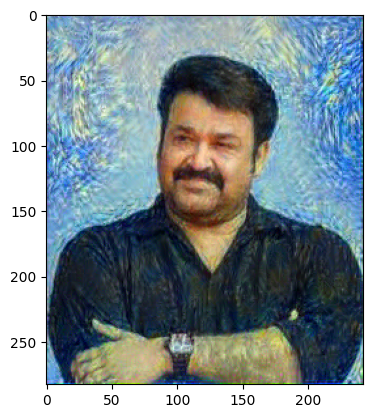

Step 6500, Total Loss: 4.427265167236328


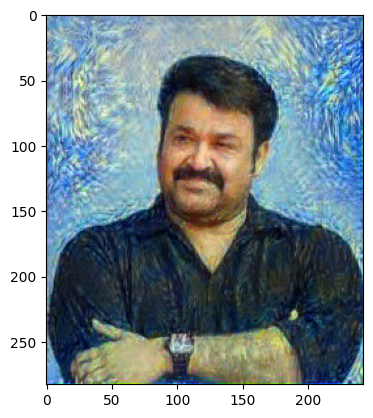

Step 7000, Total Loss: 4.3820295333862305


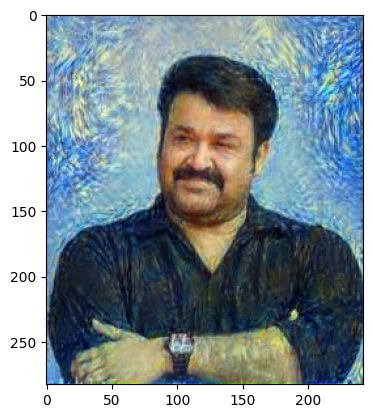

Step 7500, Total Loss: 4.346597671508789


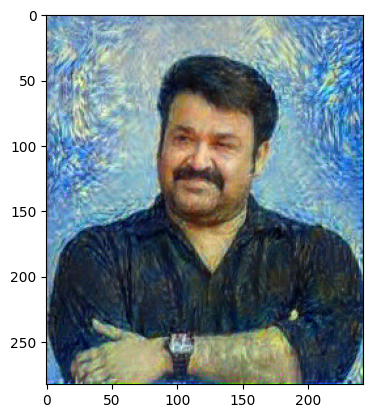

Step 8000, Total Loss: 4.313490390777588


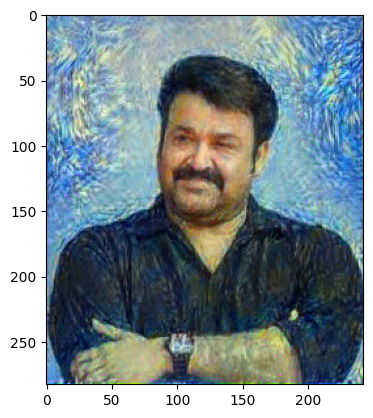

Step 8500, Total Loss: 4.288567066192627


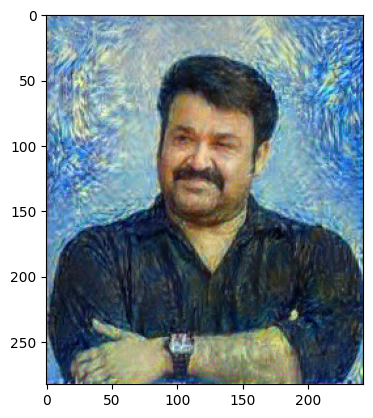

Step 9000, Total Loss: 4.265925407409668


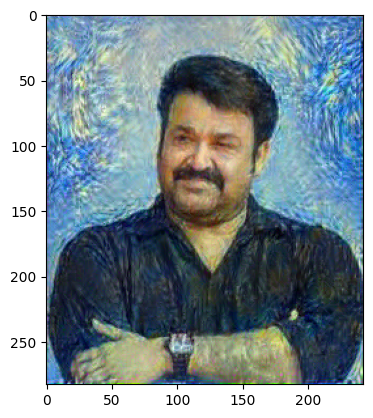

Step 9500, Total Loss: 4.245844841003418


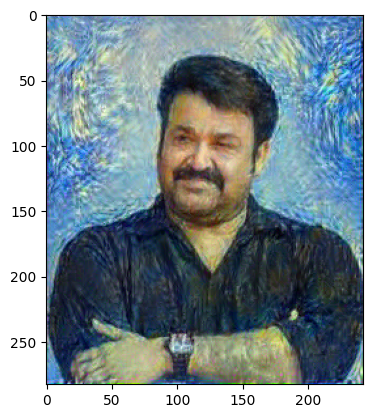

Step 10000, Total Loss: 4.228246688842773


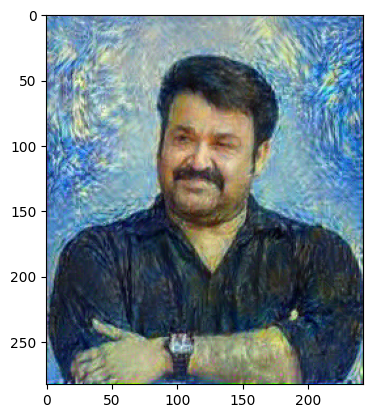

Step 10500, Total Loss: 4.215339660644531


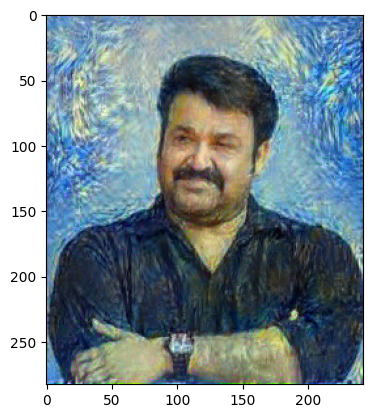

Step 11000, Total Loss: 4.205007553100586


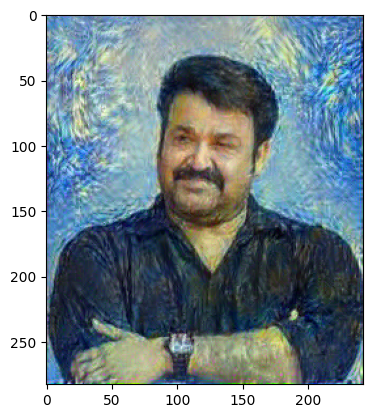

Step 11500, Total Loss: 4.193202972412109


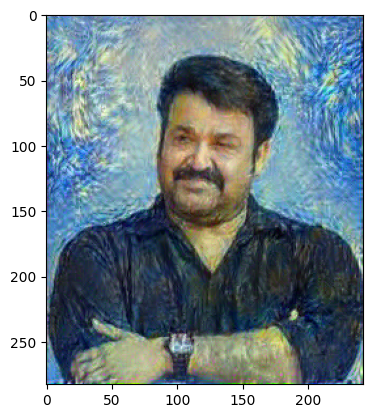

Step 12000, Total Loss: 4.184658050537109


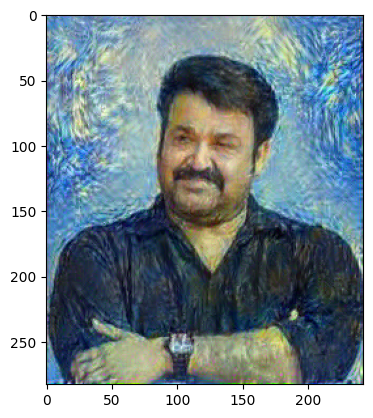

Step 12500, Total Loss: 4.1764326095581055


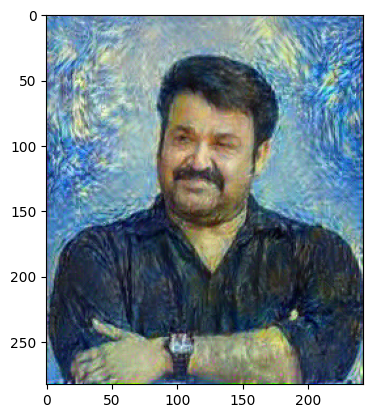

Step 13000, Total Loss: 4.168313980102539


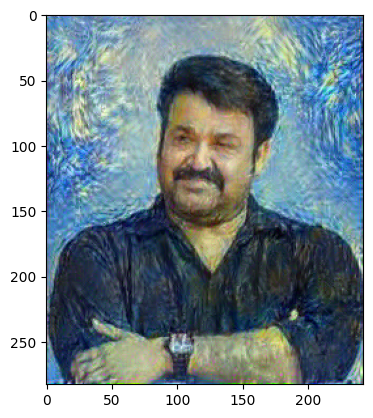

Step 13500, Total Loss: 4.159564018249512


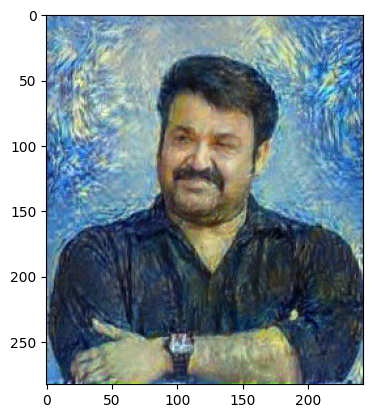

Step 14000, Total Loss: 4.154855728149414


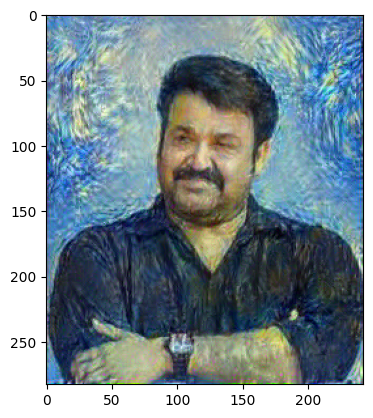

Step 14500, Total Loss: 4.149165630340576


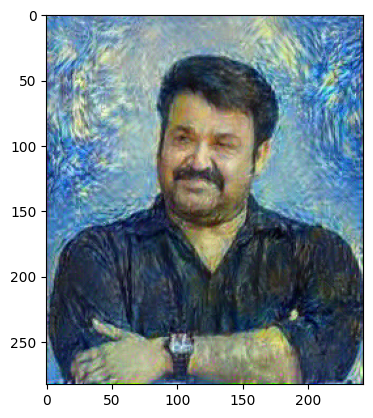

Step 15000, Total Loss: 4.14246940612793


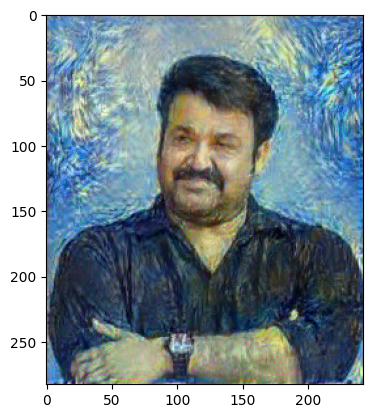

Step 15500, Total Loss: 4.138010025024414


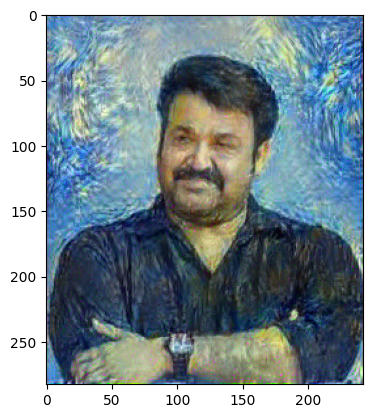

Step 16000, Total Loss: 4.135869979858398


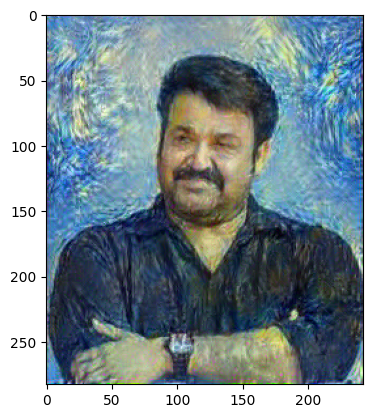

Step 16500, Total Loss: 4.130871772766113


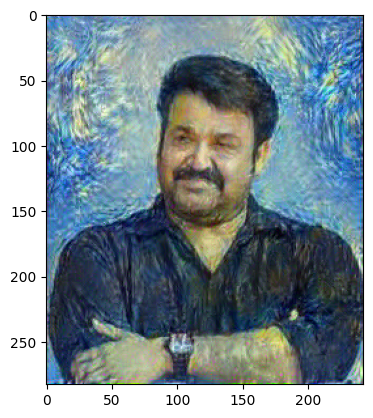

Step 17000, Total Loss: 4.126490592956543


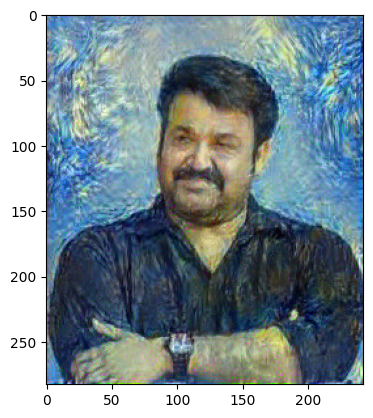

Step 17500, Total Loss: 4.124408721923828


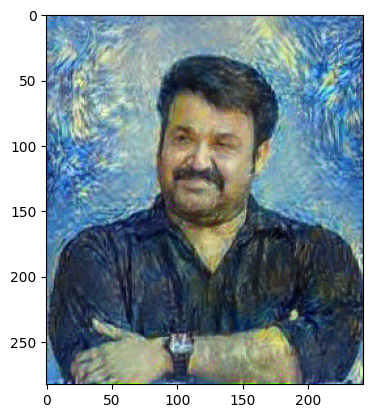

Step 18000, Total Loss: 4.11984395980835


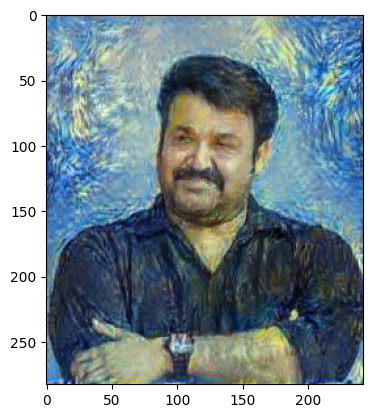

Step 18500, Total Loss: 4.116450786590576


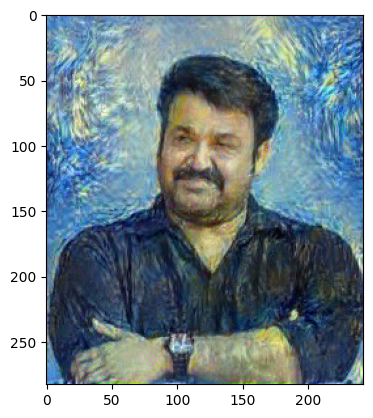

Step 19000, Total Loss: 4.112330436706543


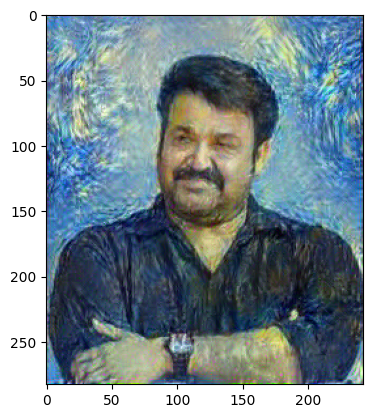

Step 19500, Total Loss: 4.111269950866699


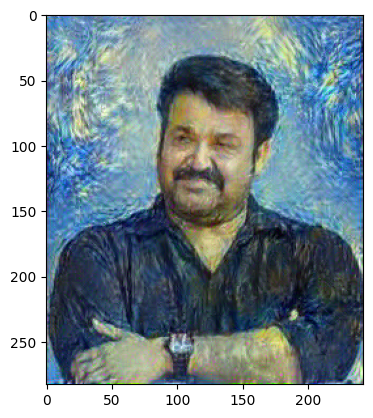

Step 20000, Total Loss: 4.108300685882568


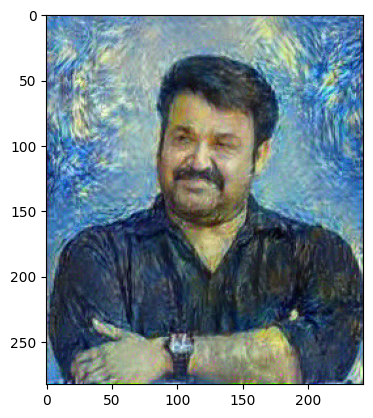

In [6]:
# 1. Load Images
content = load_image("/content/mohan.jpeg")
style = load_image("/content/va.jpeg", shape=content.shape[-2:]) # Match sizes

# 2. Pre-calculate features for Content and Style
content_features = vgg(content)
style_features = vgg(style)
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features if layer != 'content'}

# 3. Initialize target image (Start with content image)
target = content.clone().requires_grad_(True)

# 4. Weights for the loss
style_weights = {'0': 1.0, '5': 0.8, '10': 0.5, '19': 0.3, '28': 0.1}
content_weight = 1  # How much to keep the content
style_weight = 1e6  # How much to apply the style

optimizer = optim.Adam([target], lr=0.003)
steps = 20000

for ii in range(1, steps + 1):
    target_features = vgg(target)

    # Calculate Content Loss
    c_loss = torch.mean((target_features['content'] - content_features['content'])**2)

    # Calculate Style Loss
    s_loss = get_style_loss(target_features, style_grams, style_weights)

    total_loss = content_weight * c_loss + style_weight * s_loss

    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()

    if ii % 500 == 0:
        print(f'Step {ii}, Total Loss: {total_loss.item()}')
        plt.imshow(im_convert(target))
        plt.show()